# inferrence

## boring part - collapse this section.

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.utils as vutils
import base64
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
import random
import time
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision import transforms
from io import BytesIO
from PIL import Image, ImageOps
from tqdm import tqdm
import cv2
import numpy as np
from PIL import Image
import torchvision.transforms.functional as TF
import torch
import torch.nn as nn
import io

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
HR = 256
LR = 64

# https://www.kaggle.com/datasets/chetankv/dogs-cats-images
# https://www.kaggle.com/datasets/nerfviking/fantasyscifi-full-body-character-concepts
# https://www.kaggle.com/datasets/hlrhegemony/pokemon-image-dataset
experiments = {
    "fantasy": ("./data/fantasy", "checkpoints/UNet128_2025-09-12_08-24-21_fantasy.pth", "checkpoints/UNetSR3_2025-09-14_17-32-01_fantasy.pth"),
    "cats_and_dogs": ("./data/cats_and_dogs/dataset/training_set", "checkpoints/UNet128_2025-09-08_17-57-30_cats_and_dogs.pth",None),
    "pokemon": ("./data/pokemon_archive","UNet128_2025-09-12_11-03-12_pokemon.pth",None),
    "dragon": ("utils/dataset_fetcher/datasets/", "checkpoints/UNet128_2025-09-14_01-53-22_dragon.pth",None),
    "yugioh": ("data/yugioh/YuGiOhImages",None,None),
    "mnist": (None,None,None),
}

experiment_name = "fantasy"


In [3]:
# EDM noise schedule, loss weighting, and sampling procedure
P_mean = -1.2  # Mean of log-normal distribution for sigma sampling
P_std = 1.2    # Std of log-normal distribution for sigma sampling
sigma_data = 0.5  # Data standard deviation
sigma_min = 0.002
sigma_max = 80
rho = 7

def edm_sigma_schedule(t):
    return (sigma_max ** (1/rho) + t * (sigma_min ** (1/rho) - sigma_max ** (1/rho))) ** rho
def edm_loss_weight(sigma, sigma_data=sigma_data):
    return (sigma ** 2 + sigma_data ** 2) / (sigma * sigma_data) ** 2

In [4]:

# -----------------------------
# Positional embedding for timestep/sigma
# -----------------------------
class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, x):
        device = x.device
        half_dim = self.dim // 2
        emb = torch.log(torch.tensor(10000.0)) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = x[:, None] * emb[None, :]
        emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=-1)
        return emb


# -----------------------------
# Simple self-attention block
# -----------------------------
class SelfAttention(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.norm = nn.GroupNorm(8, channels)
        self.qkv = nn.Conv2d(channels, channels * 3, kernel_size=1)
        self.proj = nn.Conv2d(channels, channels, kernel_size=1)

    def forward(self, x):
        B, C, H, W = x.shape
        h = self.norm(x)
        q, k, v = self.qkv(h).chunk(3, dim=1)
        q = q.reshape(B, C, H*W).permute(0, 2, 1)  # B, HW, C
        k = k.reshape(B, C, H*W)                    # B, C, HW
        attn = torch.bmm(q, k) / (C ** 0.5)
        attn = F.softmax(attn, dim=-1)
        v = v.reshape(B, C, H*W).permute(0, 2, 1)
        h = torch.bmm(attn, v).permute(0, 2, 1).reshape(B, C, H, W)
        return x + self.proj(h)


# -----------------------------
# Residual block with optional attention
# -----------------------------
class ResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, emb_dim, use_attention=False):
        super().__init__()
        self.use_attention = use_attention
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.time_mlp = nn.Linear(emb_dim, out_ch)
        if use_attention:
            self.attn = SelfAttention(out_ch)
        if in_ch != out_ch:
            self.skip = nn.Conv2d(in_ch, out_ch, 1)
        else:
            self.skip = nn.Identity()

    def forward(self, x, t_emb):
        h = F.relu(self.conv1(x))
        h = h + self.time_mlp(t_emb)[:, :, None, None]
        h = F.relu(self.conv2(h))
        if self.use_attention:
            h = self.attn(h)
        return h + self.skip(x)


# -----------------------------
# 64x64 RGB U-Net (channel-corrected)
# -----------------------------
class UNet128(nn.Module):
    def __init__(self, in_channels=3, base_ch=64, emb_dim=128, use_attention=True):
        super().__init__()
        self.time_mlp = nn.Sequential(
            SinusoidalPosEmb(emb_dim),
            nn.Linear(emb_dim, emb_dim),
            nn.ReLU()
        )

        # Down path
        self.inc = ResBlock(in_channels, base_ch, emb_dim)
        self.down1 = ResBlock(base_ch, base_ch*2, emb_dim)
        self.down2 = ResBlock(base_ch*2, base_ch*4, emb_dim, use_attention=use_attention)
        self.down3 = ResBlock(base_ch*4, base_ch*4, emb_dim, use_attention=use_attention)
        self.pool = nn.AvgPool2d(2)

        # Middle
        self.mid = ResBlock(base_ch*4, base_ch*4, emb_dim, use_attention=use_attention)

        # Up path (channels corrected!)
        self.up3 = nn.ConvTranspose2d(base_ch*4, base_ch*4, 2, stride=2)
        self.up_block3 = ResBlock(base_ch*4 + base_ch*4, base_ch*4, emb_dim, use_attention=use_attention)

        self.up2 = nn.ConvTranspose2d(base_ch*4, base_ch*2, 2, stride=2)
        self.up_block2 = ResBlock(base_ch*2 + base_ch*4, base_ch*2, emb_dim)

        self.up1 = nn.ConvTranspose2d(base_ch*2, base_ch, 2, stride=2)
        self.up_block1 = ResBlock(base_ch + base_ch*2, base_ch, emb_dim)
        
        self.up0 = nn.ConvTranspose2d(base_ch, base_ch, 2, stride=2)
        self.up_block0 = ResBlock(base_ch + base_ch, base_ch, emb_dim)

        # Output
        self.outc = nn.Conv2d(base_ch, in_channels, 1)

    def forward(self, x, t):
        #print("in forward",x.shape, t.shape)
        if t.dim() == 1:
            t = t.float()
        else:
            t = t.squeeze(-1).float()
        t_emb = self.time_mlp(t)

        # Downsampling
        x1 = self.inc(x, t_emb)            # 64x64 -> 64x64
        x2 = self.down1(self.pool(x1), t_emb)  # 64->32
        x3 = self.down2(self.pool(x2), t_emb)  # 32->16
        x4 = self.down3(self.pool(x3), t_emb)  # 16->8

        # Middle
        m = self.mid(self.pool(x4), t_emb)     # 8->4
        #print("x shapes",x1.shape, x2.shape)
        # Upsampling
        u3 = self.up_block3(torch.cat([self.up3(m), x4], dim=1), t_emb)  # 4->8
        u2 = self.up_block2(torch.cat([self.up2(u3), x3], dim=1), t_emb) # 8->16
        u1 = self.up_block1(torch.cat([self.up1(u2), x2], dim=1), t_emb) # 16->32
        u0 = self.up_block0(torch.cat([self.up0(u1), x1], dim=1), t_emb) # 16->32

        # Final upsample to original size
        # The Chatbot's "u_final" here results in very noisy images.  Using u0 above is much better.
        #u_final = F.interpolate(u1, size=x.shape[-2:], mode='bilinear', align_corners=False)
        #print("shapes",u3.shape, u2.shape, u1.shape, u0.shape, u_final.shape, "hopefully the last 2 match")
        return self.outc(u0)


In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

# --- Helper: sinusoidal timestep embedding ---
class SRSinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, t):  # t: [B] in [0,1] float
        device = t.device
        half_dim = self.dim // 2
        freqs = torch.exp(
            torch.arange(half_dim, device=device) * -(math.log(10000) / (half_dim - 1)) 
        )
        emb = t[:, None] * freqs[None, :]   # [B, half_dim]
        emb = torch.cat([emb.sin(), emb.cos()], dim=-1)  # [B, dim]
        return emb

# --- Basic residual block ---
class SRResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)
        self.block1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.block2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.res_conv = nn.Conv2d(in_ch, out_ch, 1) if in_ch != out_ch else nn.Identity()

    def forward(self, x, t_emb):
        # x: [B, C, H, W], t_emb: [B, time_emb_dim]
        h = F.silu(self.block1(x))
        # Add time embedding as bias
        h += self.time_mlp(t_emb)[:, :, None, None]
        h = F.silu(self.block2(h))
        return h + self.res_conv(x)

# --- U-Net core ---
class UNetSR3(nn.Module):
    def __init__(self, in_ch=6, out_ch=3, base_ch=64, time_emb_dim=128):
        super().__init__()
        self.time_emb = nn.Sequential(
            SRSinusoidalPosEmb(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim * 4),
            nn.SiLU(),
            nn.Linear(time_emb_dim * 4, time_emb_dim)
        )

        # Encoder
        self.enc1 = SRResBlock(in_ch, base_ch, time_emb_dim)
        self.enc2 = SRResBlock(base_ch, base_ch * 2, time_emb_dim)
        self.enc3 = SRResBlock(base_ch * 2, base_ch * 4, time_emb_dim)

        # Bottleneck
        self.mid = SRResBlock(base_ch * 4, base_ch * 4, time_emb_dim)

        # Decoder
        self.dec3 = SRResBlock(base_ch * 4 + base_ch * 4, base_ch * 2, time_emb_dim)
        self.dec2 = SRResBlock(base_ch * 2 + base_ch * 2, base_ch, time_emb_dim)
        self.dec1 = SRResBlock(base_ch + base_ch, base_ch, time_emb_dim)

        # Final output: predict noise (same shape as HR image)
        self.out_conv = nn.Conv2d(base_ch, out_ch, 1)

        self.down = nn.AvgPool2d(2)
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)

    def forward(self, x, t):
        """
        x: [B, 6, 256, 256] = concat([x_noisy, lr_upsampled])
        t: [B] float timesteps normalized to [0,1]
        """
        # ---- time embedding ----
        t_emb = self.time_emb(t)  # [B, time_emb_dim]

        # ---- down path ----
        e1 = self.enc1(x, t_emb)           # [B, 64, 256, 256]
        e2 = self.enc2(self.down(e1), t_emb)  # [B, 128, 128, 128]
        e3 = self.enc3(self.down(e2), t_emb)  # [B, 256, 64, 64]

        # ---- bottleneck ----
        m = self.mid(e3, t_emb)             # [B, 256, 64, 64]

        # ---- up path ----
        #d3 = self.dec3(torch.cat([self.up(m), e3], dim=1), t_emb)  # [B, 128, 64, 64]
        #d2 = self.dec2(torch.cat([self.up(d3), e2], dim=1), t_emb) # [B, 64, 128, 128]
        #d1 = self.dec1(torch.cat([self.up(d2), e1], dim=1), t_emb) # [B, 64, 256, 256]
        # ---- up path (fixed spatial alignment) ----
        d3 = self.dec3(torch.cat([m, e3], dim=1), t_emb)            # [B, 128, 64, 64]
        d3_up = self.up(d3)                                         # [B, 128, 128, 128]

        d2 = self.dec2(torch.cat([d3_up, e2], dim=1), t_emb)         # [B, 64, 128, 128]
        d2_up = self.up(d2)                                         # [B, 64, 256, 256]

        d1 = self.dec1(torch.cat([d2_up, e1], dim=1), t_emb)         # [B, 64, 256, 256]

        return self.out_conv(d1)  # [B, 3, 256, 256]


In [6]:
import torch
import os

import torch
import os
from datetime import datetime

def load_checkpoint(model, optimizer, path, map_location=None):
    checkpoint = torch.load(path, map_location=map_location or "cpu")
    model.load_state_dict(checkpoint["model_state_dict"])
    if optimizer:
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    print(f"🔄 Loaded checkpoint from {path}")
    print(f"    Epoch: {checkpoint.get('epoch', '?')}, Loss: {checkpoint.get('loss', '?')}")
    print(f"    Model class: {checkpoint.get('model_class', '?')}")
    return model, optimizer, checkpoint



In [7]:
# EDM sampling procedure - Following NVIDIA's edm_sampler (Algorithm 2)
def edm_ancestral_sampling_for_diffusion(model, num_steps=18, batch_size=8, img_shape=(3, 64, 64)):
    device = next(model.parameters()).device
    
    # Initialize noise
    x_next = torch.randn((batch_size,) + img_shape, device=device)
    
    # Time step schedule (matching NVIDIA's implementation)
    step_indices = torch.arange(num_steps, dtype=torch.float64, device=device)
    t_steps = (sigma_max ** (1/rho) + step_indices / (num_steps - 1) * 
               (sigma_min ** (1/rho) - sigma_max ** (1/rho))) ** rho
    t_steps = torch.cat([t_steps, torch.zeros_like(t_steps[:1])])  # t_N = 0
    
    # Initialize with first noise level
    x_next = x_next * t_steps[0]
    
    # Main sampling loop (Heun's method)
    for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
        x_cur = x_next
        
        # Preconditioning coefficients for current timestep
        sigma = t_cur.float()
        c_skip = sigma_data ** 2 / (sigma ** 2 + sigma_data ** 2)
        c_out = sigma * sigma_data / (sigma ** 2 + sigma_data ** 2).sqrt()
        c_in = 1 / (sigma_data ** 2 + sigma ** 2).sqrt()
        c_noise = sigma.log() / 4
        
        # Euler step
        F_x = model(c_in * x_cur, c_noise.expand(batch_size))
        denoised = c_skip * x_cur + c_out * F_x
        d_cur = (x_cur - denoised) / t_cur
        x_next = x_cur + (t_next - t_cur) * d_cur
        
        # Apply 2nd order correction (Heun's method) - except for last step
        if i < num_steps - 1:
            # Preconditioning coefficients for next timestep
            sigma_next = t_next.float()
            c_skip_next = sigma_data ** 2 / (sigma_next ** 2 + sigma_data ** 2)
            c_out_next = sigma_next * sigma_data / (sigma_next ** 2 + sigma_data ** 2).sqrt()
            c_in_next = 1 / (sigma_data ** 2 + sigma_next ** 2).sqrt()
            c_noise_next = sigma_next.log() / 4
            
            F_x_next = model(c_in_next * x_next, c_noise_next.expand(batch_size))
            denoised_next = c_skip_next * x_next + c_out_next * F_x_next
            d_prime = (x_next - denoised_next) / t_next
            x_next = x_cur + (t_next - t_cur) * (0.5 * d_cur + 0.5 * d_prime)
    
    return x_next.to("cpu")

In [8]:
# TODO - re-merge with the one above
def edm_ancestral_sampling_for_sr(model, lr_64, num_steps=18, batch_size=8, img_shape=(1, 28, 28),
                           headstart_sigma:float|None=None):
    """
        EDM ancestral sampling with optional noisy-LR head-start.
        
        Args:
            model: UNet denoiser
            lr_up: upscaled LR image [B, 3, H, W]
            num_steps: number of sampling steps
            batch_size: batch size
            img_shape: shape of output images
            headstart_sigma: float or None
                If None, start from pure noise.
                If float, adds Gaussian noise with this std to lr_up for head-start.
    """
    device = next(model.parameters()).device
    lr_up = F.interpolate(lr_64, size=(256,256), mode='bilinear', align_corners=False)

    # Initialize noise
    # ------------------- Head-start initialization -------------------
    if headstart_sigma is None:
        # Original behavior: pure Gaussian noise
        x_next = torch.randn((batch_size,) + img_shape, device=device)
    else:
        # Start from LR upsample + moderate noise
        lr_up_resized = F.interpolate(lr_up, size=img_shape[-2:], mode='bilinear', align_corners=False)
        x_next = lr_up_resized.to(device) + headstart_sigma * torch.randn((batch_size,) + img_shape, device=device)
    # ------------------------------------------------------------------

    
    # Time step schedule (matching NVIDIA's implementation)
    step_indices = torch.arange(num_steps, dtype=torch.float64, device=device)
    t_steps = (sigma_max ** (1/rho) + step_indices / (num_steps - 1) * 
               (sigma_min ** (1/rho) - sigma_max ** (1/rho))) ** rho
    t_steps = torch.cat([t_steps, torch.zeros_like(t_steps[:1])])  # t_N = 0
    
    # Initialize with first noise level
    #-----------------------------------------------------
    # after head-start initialization
    if headstart_sigma is not None:
        """
        https://chatgpt.com/share/68c6111a-55d0-800b-b1b3-14e3cf3ff731
        Some papers also rescale the remaining t_steps proportionally to account for the lower starting noise, 
        so the schedule adapts dynamically. But the simplest correct approach is just to replace the first t_steps[0] with the actual headstart_sigma.
        """
        #t_steps[0] = headstart_sigma
        #sigma_max = headstart_sigma
        t_steps = (headstart_sigma ** (1/rho) + step_indices / (num_steps - 1) * 
               (sigma_min ** (1/rho) - headstart_sigma ** (1/rho))) ** rho
        t_steps = torch.cat([t_steps, torch.zeros_like(t_steps[:1])])  # t_N = 0
    else:
        x_next = x_next * t_steps[0]

    
    #-----------------------------------------------------
    # Main sampling loop (Heun's method)
    for i, (t_cur, t_next) in enumerate(zip(t_steps[:-1], t_steps[1:])):
        x_cur = x_next
        
        # Preconditioning coefficients for current timestep
        sigma = t_cur.float()
        c_skip = sigma_data ** 2 / (sigma ** 2 + sigma_data ** 2)
        c_out = sigma * sigma_data / (sigma ** 2 + sigma_data ** 2).sqrt()
        c_in = 1 / (sigma_data ** 2 + sigma ** 2).sqrt()
        c_noise = sigma.log() / 4
        
        # Euler step
        this_models_input = torch.cat([c_in*x_cur, lr_up], dim=1).to(device)
        #F_x = model(c_in * x_cur, c_noise.expand(batch_size))
        F_x = model(this_models_input, c_noise.expand(batch_size))
        denoised = c_skip * x_cur + c_out * F_x
        d_cur = (x_cur - denoised) / t_cur
        x_next = x_cur + (t_next - t_cur) * d_cur
        
        # Apply 2nd order correction (Heun's method) - except for last step
        if i < num_steps - 1:
            # Preconditioning coefficients for next timestep
            sigma_next = t_next.float()
            c_skip_next = sigma_data ** 2 / (sigma_next ** 2 + sigma_data ** 2)
            c_out_next = sigma_next * sigma_data / (sigma_next ** 2 + sigma_data ** 2).sqrt()
            c_in_next = 1 / (sigma_data ** 2 + sigma_next ** 2).sqrt()
            c_noise_next = sigma_next.log() / 4
            
            #F_x_next = model(c_in_next * x_next, c_noise_next.expand(batch_size))
            this_models_input = torch.cat([c_in_next * x_next, lr_up], dim=1).to(device)
            F_x_next = model(this_models_input, c_noise_next.expand(batch_size))


            denoised_next = c_skip_next * x_next + c_out_next * F_x_next
            d_prime = (x_next - denoised_next) / t_next
            x_next = x_cur + (t_next - t_cur) * (0.5 * d_cur + 0.5 * d_prime)
    
    return x_next.to("cpu")

In [9]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

def generate_images(model_edm, num_steps=15, batch_size=20, img_shape = (3,64,64)):
    to_pil = transforms.ToPILImage()
    with torch.no_grad():
        samples = edm_ancestral_sampling_for_diffusion(model_edm, num_steps=num_steps, batch_size=batch_size, img_shape=(3, 64, 64)).cpu()
        samples = (samples + 1) / 2  # scale from [-1,1] to [0,1]
        samples = samples.clamp(0, 1)
        pil_images = [to_pil(img) for img in samples]
    return pil_images

import base64
import io

def sr_to_pil(sr_tensor):
    """sr_tensor: [3,H,W] or [B,3,H,W] float in [-1,1] returns: PIL Image (RGB)"""
    if sr_tensor.dim() == 4:
        sr_tensor = sr_tensor[0] # first in batch
    sr_tensor = ((sr_tensor.clamp(-1, 1) + 1) * 127.5).to(torch.uint8)
    sr_np = sr_tensor.permute(1,2,0).cpu().numpy()
    return Image.fromarray(sr_np)


def pil_to_data_url(pil_img):
    buffered = BytesIO()
    pil_img.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"

def html_for_images(pil_images, min_height=64, title="Hi"):
    data_urls = [pil_to_data_url(img) for img in pil_images]
    html = f"""
    <h2>{title}</h2>
    <div style="display: flex; flex-wrap: wrap; gap: 2px;">
    """
    for url in data_urls:
        html += f"""
        <div style="flex: 0 0 auto;">
            <img src="{url}" style="min-width: {min_height}px;"/>
        </div>
        """
    html += "</div>"
    return html

def sample_html(model, batch_size=12, img_shape=(3,64,64), num_steps=36, title="EDM Samples",min_height=128):
    imgs = generate_images(model_edm=model, batch_size=batch_size, img_shape=img_shape, num_steps=16)
    h = html_for_images(imgs, title=title, min_height=min_height)
    return h


In [10]:

def generate_html_examples(cp="checkpoints/UNet128_2025-09-12_19-47-15_dragon.pth",batch_size=12):
    with torch.no_grad():
        model_edm = UNet128(use_attention=True).to(device)
        optimizer_edm = None
        load_checkpoint(model_edm, optimizer_edm, cp)
        imgs = generate_images(model_edm=model_edm, batch_size=batch_size, img_shape=(3,64,64), num_steps=16)
        return imgs


In [11]:
def scale_to_minus_one_to_one(x):
    return x * 2. - 1.
def imgs_to_sr_tensors(imgs):
    lr_transform = transforms.Compose([
            transforms.Resize((LR, LR)),
            transforms.ToTensor(),
            transforms.Lambda(scale_to_minus_one_to_one),
    ])
    return torch.stack([lr_transform(img) for img in imgs])


## Generate some images.

🔄 Loaded checkpoint from checkpoints/UNet128_2025-09-14_02-20-07_fantasy.pth
    Epoch: 2, Loss: 0.08024808764457703
    Model class: UNet128



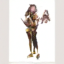
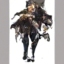
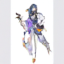
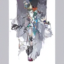
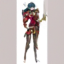
...
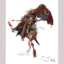
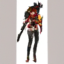
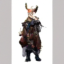
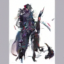
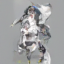

In [15]:
imgs = generate_html_examples(cp="checkpoints/UNet128_2025-09-14_02-20-07_fantasy.pth")
h = html_for_images(imgs,title="Generated from fantasy checkpoint")
ipd.HTML(h)

In [23]:
lr = imgs_to_sr_tensors(imgs)
good_path = 'checkpoints/UNetSR3_2025-09-15_08-14-19__SR_fantasy_really_good.pth'
#good_path = 'checkpoints/UNetSR3_2025-09-15_19-38-09__SR_dragon_really_good.pth'
sr_model = UNetSR3().cuda()
load_checkpoint(sr_model, None, good_path)

with torch.inference_mode():
    print(lr.shape)
    out1 = edm_ancestral_sampling_for_sr(sr_model, lr.cuda(), num_steps=18,batch_size=12,img_shape=(3,256,256))
    out2 = edm_ancestral_sampling_for_sr(sr_model, lr.cuda(), num_steps=18,batch_size=12,img_shape=(3,256,256), headstart_sigma=3)
    out3 = edm_ancestral_sampling_for_sr(sr_model, lr.cuda(), num_steps=3, batch_size=12,img_shape=(3,256,256), headstart_sigma=1)


🔄 Loaded checkpoint from checkpoints/UNetSR3_2025-09-15_08-14-19__SR_fantasy_really_good.pth
    Epoch: 85, Loss: 0.11
    Model class: UNetSR3
torch.Size([12, 3, 64, 64])


Legend:
      1. low res 64x64 on left - generated from the diffusion model
      2. upscaled (blurry) low-res
      3. Full super-resolution diffusion
      4. Headstart diffusion adding 3-sigma noise to the upscaled LR [half way between traditional and Toyota]
      5. One-shot SR - 
      



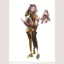
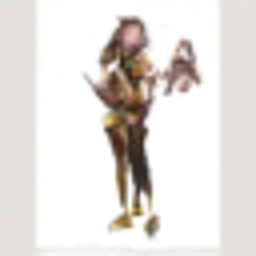
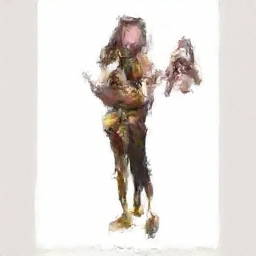
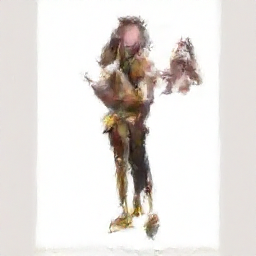
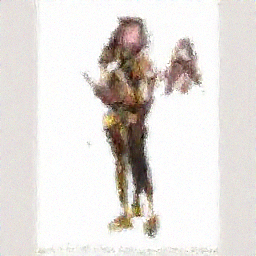


...


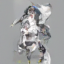
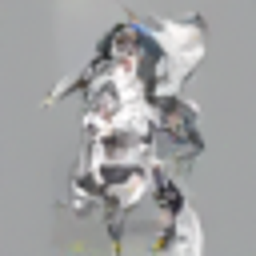
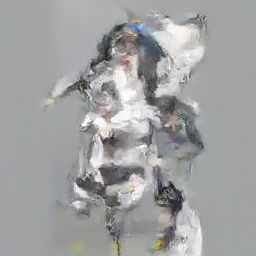
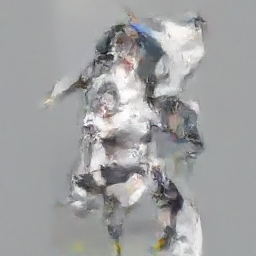
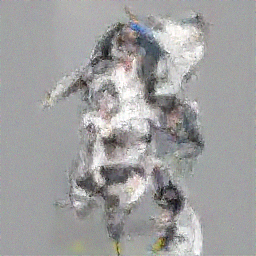

In [38]:
print("""Legend:
      1. low res 64x64 on left - generated from the diffusion model
      2. upscaled (blurry) low-res
      3. Full super-resolution diffusion
      4. Headstart diffusion adding 3-sigma noise to the upscaled LR [half way between traditional and Toyota]
      5. One-shot SR - 
      """)
for idx in range(lr.shape[0]):
    lri,sri,sri2,sri3 = [sr_to_pil(i) for i in [lr[idx],out1[idx],out2[idx],out3[idx]]]
    title = f"Imgs for {idx}"
    h = html_for_images([lri,lri.resize((256,256)),sri,sri2,sri3], title=title)
    ipd.display(ipd.HTML(h))

🔄 Loaded checkpoint from checkpoints/UNet128_2025-09-12_19-47-15_dragon.pth
    Epoch: 0, Loss: 0.10294210910797119
    Model class: UNet128



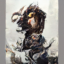
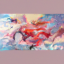
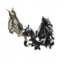
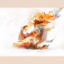
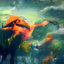
...
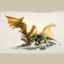
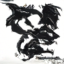
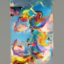
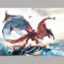
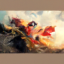

In [44]:
imgs = generate_html_examples(cp="checkpoints/UNet128_2025-09-12_19-47-15_dragon.pth")
h = html_for_images(imgs,title="Generated from dragon checkpoint", min_height=128)
ipd.HTML(h)

In [45]:
lr = imgs_to_sr_tensors(imgs)
#good_path = 'checkpoints/UNetSR3_2025-09-15_08-14-19__SR_fantasy_really_good.pth'
good_path = 'checkpoints/UNetSR3_2025-09-15_19-38-09__SR_dragon_really_good.pth'
sr_model = UNetSR3().cuda()
load_checkpoint(sr_model, None, good_path)

with torch.inference_mode():
    print(lr.shape)
    out1 = edm_ancestral_sampling_for_sr(sr_model, lr.cuda(), num_steps=18,batch_size=12,img_shape=(3,256,256))
    out2 = edm_ancestral_sampling_for_sr(sr_model, lr.cuda(), num_steps=18,batch_size=12,img_shape=(3,256,256), headstart_sigma=3)
    out3 = edm_ancestral_sampling_for_sr(sr_model, lr.cuda(), num_steps=3, batch_size=12,img_shape=(3,256,256), headstart_sigma=1)



🔄 Loaded checkpoint from checkpoints/UNetSR3_2025-09-15_19-38-09__SR_dragon_really_good.pth
    Epoch: 85, Loss: 0.11
    Model class: UNetSR3
torch.Size([12, 3, 64, 64])


Legend:
      1. low res 64x64 on left - generated from the diffusion model
      2. upscaled (blurry) low-res
      3. Full super-resolution diffusion
      4. Headstart diffusion adding 3-sigma noise to the upscaled LR [half way between traditional and Toyota]
      5. One-shot SR - 
      



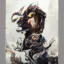
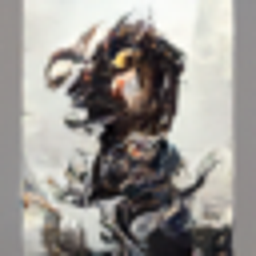
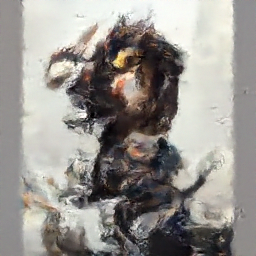
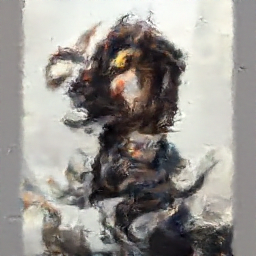
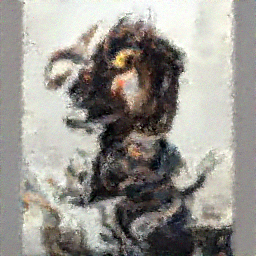


...


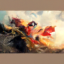
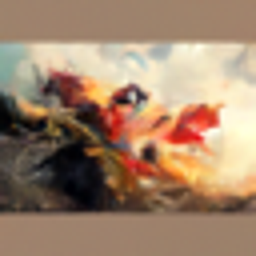
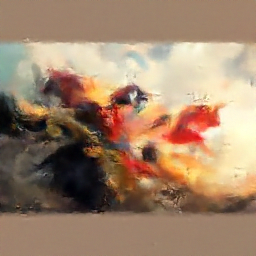
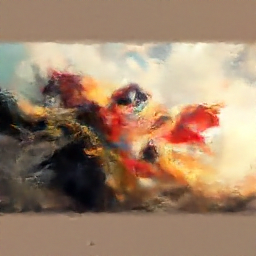
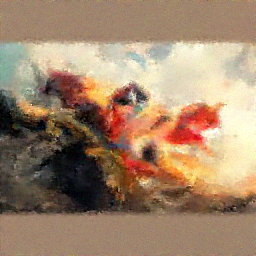

In [46]:
print("""Legend:
      1. low res 64x64 on left - generated from the diffusion model
      2. upscaled (blurry) low-res
      3. Full super-resolution diffusion
      4. Headstart diffusion adding 3-sigma noise to the upscaled LR [half way between traditional and Toyota]
      5. One-shot SR - 
      """)
for idx in range(lr.shape[0]):
    lri,sri,sri2,sri3 = [sr_to_pil(i) for i in [lr[idx],out1[idx],out2[idx],out3[idx]]]
    title = f"Imgs for {idx}"
    h = html_for_images([lri,lri.resize((256,256)),sri,sri2,sri3], title=title)
    ipd.display(ipd.HTML(h))

🔄 Loaded checkpoint from checkpoints/UNet128_2025-09-08_17-57-30_cats_and_dogs.pth
    Epoch: 3306, Loss: 0.13632425665855408
    Model class: UNet128



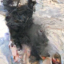
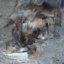
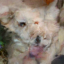
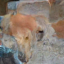
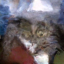
...
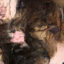
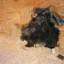
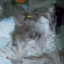
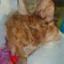
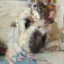

In [ ]:
imgs = generate_html_examples(cp="checkpoints/UNet128_2025-09-08_17-57-30_cats_and_dogs.pth")
h = html_for_images(imgs,title="Generated from cats_and_dogs checkpoint")
ipd.HTML(h)